# Data Profiling

Data Profiling of the four data sources we will be using for our project.

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
from tkinter import *

## Data Source 1: Traffic Tickets Issued: Four Year Window

We import the data source, check the head, tail, and look for any nulls.

In [26]:
df_1 = pd.read_csv('/Users/mark/Downloads/Traffic_Tickets_Issued__Four_Year_Window.csv')

In [27]:
df_1.head()

,Violation Charged Code,Violation Description,Violation Year,Violation Month,Violation Day of Week,Age at Violation,Gender,State of License,Police Agency,Court,Source
0,1229C3,NO SEAT BELT ADULT,2018,1,SUNDAY,49.0,M,NEW YORK,NYC POLICE DEPT,BRONX TVB,TVB
1,1180D12,SPEED IN ZONE 11-30,2018,1,SUNDAY,17.0,M,NEW YORK,NYC POLICE DEPT,BRONX TVB,TVB
2,37512A2,SIDEWINGS/SIDEWINDOWS/NON/TRANSPARENT,2018,1,SUNDAY,54.0,M,NEW JERSEY,NYC POLICE DEPT,MANHATTAN SOUTH TVB,TVB
3,37512A3,REAR SIDE WINDOWS NON/TRANSPARENT,2018,1,SUNDAY,21.0,M,NEW YORK,NYC POLICE DEPT,MANHATTAN SOUTH TVB,TVB
4,1180D12,SPEED IN ZONE 11-30,2018,1,SUNDAY,22.0,M,NEW YORK,NYC POLICE DEPT,BROOKLYN SOUTH TVB,TVB


In [28]:
df_1.tail()

,Violation Charged Code,Violation Description,Violation Year,Violation Month,Violation Day of Week,Age at Violation,Gender,State of License,Police Agency,Court,Source
11902568,11922,DRIVING W/.08 OF 1 PERCENT OF ALCO/BLD,2021,12,SUNDAY,53.0,M,NEW YORK,HAWTHORNE STATE POLICE,YONKERS CITY COURT,TSLED
11902569,5091,UNLICENSED OPERATOR,2021,11,WEDNESDAY,26.0,M,NEW YORK,CORNWALL TOWN POLICE DEPT,CORNWALL TOWN COURT,TSLED
11902570,1172A,FLD TO STOP AT STOP SIGN,2021,11,MONDAY,48.0,M,NEW YORK,NEWBURGH CITY POLICE DEPT,NEWBURGH CITY COURT,TSLED
11902571,1172A,FLD TO STOP AT STOP SIGN,2021,11,MONDAY,39.0,M,NEW YORK,NEWBURGH CITY POLICE DEPT,NEWBURGH CITY COURT,TSLED
11902572,11923,DRIVING WHILE INTOXICATED,2021,11,FRIDAY,24.0,M,NEW YORK,TARRYTOWN TWAY STATE POLICE,WHITE PLAINS CITY COURT,TSLED


In [29]:
null_rate = df_1.isna().mean().round(4).to_frame()
null_rate

,0
Violation Charged Code,0.0000
Violation Description,0.0000
Violation Year,0.0000
Violation Month,0.0000
Violation Day of Week,0.0000
Age at Violation,0.0163
Gender,0.0000
State of License,0.0000
Police Agency,0.0000
Court,0.0000


We then use the pandas profiling library to help in initial data analysis, particularly with regards to distinct values, duplicate rows, and correlations.

In [37]:
df_1.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We create several initial data exploration charts, including distribution of Age at Violation, distribution of gender, and distribution of day of week of violation.

In [30]:
%matplotlib inline

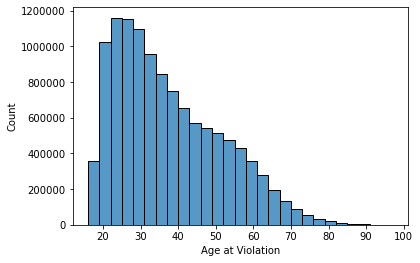

In [31]:
sns.histplot(data=df_1, x = "Age at Violation", binwidth = 3, log_scale = False)
plt.ticklabel_format(style='plain', axis='y')
plt.show()

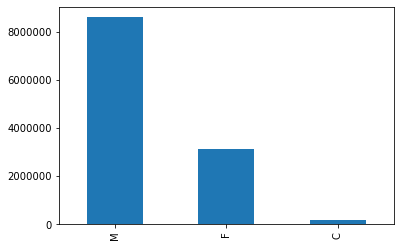

In [35]:
pd.value_counts(df_1['Gender']).plot.bar()
plt.ticklabel_format(style='plain', axis='y')


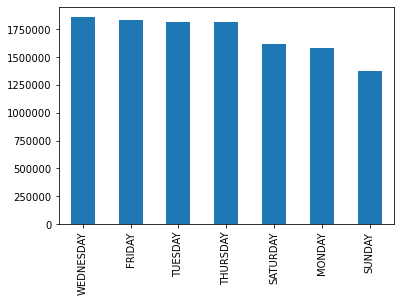

In [36]:
df_1['Violation Day of Week'].value_counts().plot.bar()
plt.ticklabel_format(style='plain', axis='y')

## Data Source 2: Motor Vehicle Crashes - Violation Information: Three Year Window

Again, we import, print the head, tail, analyze for nulls, and develop a profile report.

In [38]:
df_2 = pd.read_csv('/Users/mark/Downloads/Motor_Vehicle_Crashes_-_Violation_Information__Three_Year_Window.csv')

In [40]:
df_2.head()

,Year,Violation Description,Violation Code,Case Individual ID
0,2019,UNREGISTERED MOTOR VEHICLE,4011A,21443237
1,2019,UNLICENSED OPERATOR,5091,21443393
2,2019,DRIVING WHILE INTOXICATED,11923,21443718
3,2019,REFUSAL TO TAKE BREATH TEST,11941B,21443718
4,2019,AGGRAVATED DWI - BLOOD ALCOHOL CONTENT .18 OR ...,11922AA,21443718


In [41]:
df_2.tail()

,Year,Violation Description,Violation Code,Case Individual ID
238039,2018,OPERATING W/O INSURANCE INF.,3191U,22452579
238040,2018,DRIVING WHILE INTOXICATED,11923,22452579
238041,2018,DROVE ACROSS HAZARD MARKING,1128D,22452579
238042,2018,DRIVING WHILE INTOXICATED,11923,22458334
238043,2018,AGGRAVATED DWI - BLOOD ALCOHOL CONTENT .18 OR ...,11922AA,22458334


In [48]:
null_rate_2 = df_2.isna().mean().round(4).to_frame()
null_rate_2

,0
Year,0.0
Violation Description,0.0
Violation Code,0.0
Case Individual ID,0.0


In [44]:
df_2.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

As the initial data profiling shows, Violation Description has many different categories, so we look for the percentage of the top ten value counts in this column.

In [47]:
df_2['Violation Description'].value_counts(normalize=True).nlargest(10)


FOLLOWING TOO CLOSELY                 0.116462
UNLICENSED OPERATOR                   0.110954
MOVED FROM LANE UNSAFELY              0.084686
SPEED NOT REASONABLE & PRUDENT        0.069441
DRIVING WHILE INTOXICATED             0.046693
LEAVING/SCENE PROPERTY DAMAGE ACC.    0.046189
AGGRAVATED UNLIC OP 3RD MISD          0.039711
FAILED TO KEEP RIGHT                  0.029696
UNREGISTERED MOTOR VEHICLE            0.023752
FLD TO YLD RT-OF-WAY ON LEFT TURN     0.023223
Name: Violation Description, dtype: float64

## Data Source 3: Motor Vehicle Crashes - Individual Information: Three Year Window

In [50]:
df_3 = pd.read_csv('/Users/mark/Downloads/Motor_Vehicle_Crashes_-_Individual_Information__Three_Year_Window.csv')

Again, we import, print the head, tail, analyze for nulls, and develop a profile report.

In [51]:
df_3.head()

,Year,Case Individual ID,Case Vehicle ID,Victim Status,Role Type,Seating Position,Ejection,License State Code,Sex,Transported By,Safety Equipment,Injury Descriptor,Injury Location,Injury Severity,Age
0,2019,526700,16324238,NaN,Driver -- Missing Information,Driver,NaN,NaN,U,NaN,NaN,NaN,NaN,Uninjured,NaN
1,2019,526701,16324505,NaN,Driver -- Missing Information,Driver,NaN,NaN,U,NaN,NaN,NaN,NaN,Uninjured,NaN
2,2019,526702,16328743,NaN,Registrant,Not Entered,NaN,NaN,U,NaN,NaN,NaN,NaN,Uninjured,NaN
3,2019,526703,16329116,NaN,Registrant,Not Entered,NaN,NaN,U,NaN,NaN,NaN,NaN,Uninjured,NaN
4,2019,526704,16329167,NaN,Driver -- Missing Information,Driver,NaN,NaN,U,NaN,NaN,NaN,NaN,Uninjured,NaN


In [52]:
df_3.tail()

,Year,Case Individual ID,Case Vehicle ID,Victim Status,Role Type,Seating Position,Ejection,License State Code,Sex,Transported By,Safety Equipment,Injury Descriptor,Injury Location,Injury Severity,Age
2175079,2018,22463565,17099265,Conscious,Pedestrian,Not Applicable,Not Applicable,NaN,F,Not Entered,Not Applicable,Minor Bleeding,Hip-Upper Leg,Moderate,11.0
2175080,2018,22463605,15556188,Not Entered,Driver of a Motor Vehicle in Transport,Driver,Not Ejected,CT,M,Not Entered,Lap Belt/Harness,Not Entered,Not Entered,Uninjured,60.0
2175081,2018,22463635,17097537,Not Entered,Passenger of a Motor Vehicle in Transport,Driver,Not Ejected,NaN,F,Not Entered,Lap Belt/Harness,Not Entered,Not Entered,Uninjured,32.0
2175082,2018,22463636,17097538,Not Entered,Passenger of a Motor Vehicle in Transport,Driver,Not Ejected,NaN,M,Not Entered,Lap Belt/Harness,Not Entered,Not Entered,Uninjured,55.0
2175083,2018,22463990,17084349,Not Entered,Passenger of a Motor Vehicle in Transport,Driver,Not Ejected,NaN,M,Not Entered,Lap Belt/Harness,Not Entered,Not Entered,Uninjured,50.0


In [53]:
null_rate_3 = df_3.isna().mean().round(4).to_frame()
null_rate_3

,0
Year,0.0000
Case Individual ID,0.0000
Case Vehicle ID,0.0000
Victim Status,0.0426
Role Type,0.0000
Seating Position,0.0000
Ejection,0.0426
License State Code,0.3208
Sex,0.0000
Transported By,0.1105


In [54]:
df_3.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We want to investigate the various injury severities, so we show a histogram and their value counts.

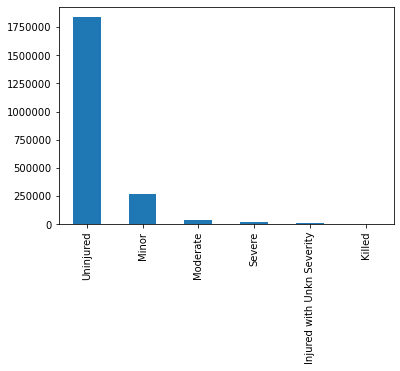

In [55]:
pd.value_counts(df_3['Injury Severity']).plot.bar()
plt.ticklabel_format(style='plain', axis='y')


In [58]:
df_3['Injury Severity'].value_counts()


Uninjured                     1837918
Minor                          264646
Moderate                        36136
Severe                          22708
Injured with Unkn Severity      11802
Killed                           1874
Name: Injury Severity, dtype: int64

## Data Source 4: Motor Vehicle Crashes - Vehicle Information: Three Year Window

Again, we import, print the head, tail, analyze for nulls, and develop a profile report.

In [60]:
df_4 = pd.read_csv('/Users/mark/Downloads/Motor_Vehicle_Crashes_-_Vehicle_Information__Three_Year_Window.csv')

In [61]:
df_4.head()

,Year,Case Vehicle ID,Vehicle Body Type,Registration Class,Action Prior to Accident,Type / Axles of Truck or Bus,Direction of Travel,Fuel Type,Vehicle Year,State of Registration,Number of Occupants,Engine Cylinders,Vehicle Make,Contributing Factor 1,Contributing Factor 1 Description,Contributing Factor 2,Contributing Factor 2 Description,Event Type,Partial VIN
0,2019,15350252,4 DOOR SEDAN,PASSENGER OR SUBURBAN,Going Straight Ahead,Not Entered,North,Gas,2016.0,NY,1.0,4.0,TOYOT,HUMAN,Lost Consciousness,HUMAN,Illness,Not Entered,2T1BURHE2GC571717
1,2019,16323841,4 DOOR SEDAN,PASSENGER OR SUBURBAN,Making Right Turn,Not Entered,Southeast,Gas,2007.0,NY,1.0,4.0,HYUND,HUMAN,Turning Improperly,HUMAN,Not Applicable,Not Applicable,KMHDU46D47U022363
2,2019,16323842,SUBURBAN,Not Entered,Making Left Turn,Not Entered,Northwest,Not Entered,2016.0,NJ,2.0,NaN,LEXS,HUMAN,Not Applicable,HUMAN,Not Applicable,Not Applicable,2T2BZMCAXGC040009
3,2019,16323847,SUBURBAN,PASSENGER OR SUBURBAN,Making Left Turn,Not Entered,North,Gas,2007.0,NY,2.0,4.0,TOYOT,HUMAN,Unknown,HUMAN,Not Applicable,Not Applicable,JTEGD21A470165836
4,2019,16323848,4 DOOR SEDAN,Not Entered,Making Left Turn,Not Entered,North,Not Entered,NaN,NY,2.0,NaN,NaN,ENVMT,View Obstructed/Limited,ENVMT,Pavement Slippery,Not Applicable,NaN


In [63]:
df_4.tail()

,Year,Case Vehicle ID,Vehicle Body Type,Registration Class,Action Prior to Accident,Type / Axles of Truck or Bus,Direction of Travel,Fuel Type,Vehicle Year,State of Registration,Number of Occupants,Engine Cylinders,Vehicle Make,Contributing Factor 1,Contributing Factor 1 Description,Contributing Factor 2,Contributing Factor 2 Description,Event Type,Partial VIN
1648848,2018,17097774,2 DOOR SEDAN,PASSENGER OR SUBURBAN,Parked,Not Entered,East,Gas,2017.0,NY,0.0,6.0,DODGE,HUMAN,Not Entered,HUMAN,Not Entered,Not Entered,2C3CDZAG6HH640890
1648849,2018,17097775,PICKUP TRUCK,Not Entered,Parked,Not Entered,Southwest,Not Entered,NaN,NY,0.0,NaN,NaN,HUMAN,Not Entered,HUMAN,Not Entered,Not Entered,NaN
1648850,2018,17097777,UNKNOWN VEHICLE,Not Entered,Unknown,Not Entered,Unknown,Not Entered,NaN,NaN,NaN,NaN,NaN,HUMAN,Not Entered,HUMAN,Not Entered,Not Entered,NaN
1648851,2018,17097778,PEDESTRIAN,Not Entered,Not Applicable,Not Entered,Not Applicable,Not Entered,NaN,NaN,NaN,NaN,NaN,HUMAN,Not Entered,HUMAN,Not Entered,Not Entered,NaN
1648852,2018,17099265,PEDESTRIAN,Not Entered,Not Applicable,Not Entered,Not Applicable,Not Entered,NaN,NaN,NaN,NaN,NaN,HUMAN,Not Applicable,HUMAN,Not Applicable,Not Entered,NaN


In [64]:
null_rate_4 = df_4.isna().mean().round(4).to_frame()
null_rate_4

,0
Year,0.0000
Case Vehicle ID,0.0000
Vehicle Body Type,0.0000
Registration Class,0.0000
Action Prior to Accident,0.0000
Type / Axles of Truck or Bus,0.0000
Direction of Travel,0.0000
Fuel Type,0.0000
Vehicle Year,0.1654
State of Registration,0.0753


In [65]:
df_4.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We plot the top 10 Actions Prior To Accident, and Contributing Factor 1 Description which are both useful in determining causes and situations of accident rates.

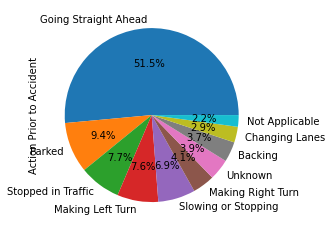

In [88]:
pd.value_counts(df_4['Action Prior to Accident']).nlargest(10).plot.pie(autopct='%1.1f%%')
autopct='%1.1f%%'

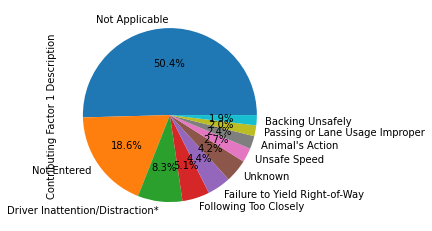

In [90]:
pd.value_counts(df_4['Contributing Factor 1 Description']).nlargest(10).plot.pie(autopct='%1.1f%%')
autopct='%1.1f%%'